# Getting started with dataTap

dataTap is an easy-to-use data management solution that enables developers to quickly define complex datasets and use them to train ML models.

In this guide, we will use dataTap and [torchvision](https://github.com/pytorch/vision) to train a simple person detector. To follow along, sign into [app.datatap.dev](https://app.datatap.dev) to get your free API token.

## Connecting to the API

To get started with datatap, import the `Api` class from the `datatap` module, and instantiate it with your API key. Once you have an `Api` instance, we can use it to find datasets.

dataTap supports multiple databases for developers who want to bring their own private data. Additionally, it also provides a public database that anyone can connect to and use. We'll start by calling the method `api.get_default_database()`, which will connect us to that public database. We can then browse the list of available datasets. Here, we will use the `widerperson` dataset, which may be found on [app.datatap.dev](https://app.datatap.dev).

To double check that this dataset is in fact a person detection dataset, we can print its `template`, an object that describes what its data looks like.

In [1]:
from datatap import Api

from datatap.utils import force_pretty_print
force_pretty_print()

api = Api("xxxxxxxx-xxxx-xxxx-xxxx-xxxxxxxxxxx")

database = api.get_default_database()
repository = database.get_repository("public/widerperson")
dataset = repository.get_dataset("latest")

## Building a Model

dataTap is platform and model agnostic, and so it can be dropped into any existing training pipeline. In this example, we will use the Torchvision implementation of [Faster R-CNN](https://pytorch.org/docs/stable/torchvision/models.html#faster-r-cnn).

We can begin by creating a class map using the classes in our template. For `FasterRCNN`, we will need to add the `__background__` class in addition to the `person` class. This is used by the model to identify a potential detection as being "nothing". Once we've created the class map, we can instantiate the model. For this example, we will be retraining the "head" from scratch, but we will use a pretrained backbone to speed up the process.

Additionally, this code will attempt to train on a GPU if one is available. If you would like to only train on CPU, you can explicitly set `device = torch.device("cpu")`

In [2]:
import torch
import torchvision

device = torch.device("cuda") if torch.cuda.is_available else torch.device("cpu")

classes = list(dataset.template.classes.keys())
classes_with_background = ["__background__"] + classes

class_map = {
    cls: i + 1
    for i, cls in enumerate(classes)
}
class_map_with_background = {
    cls: i
    for i, cls in enumerate(classes_with_background)
}

# torchvision provides several pre-made detection models, such as
# this one
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
    pretrained=False,
    pretrained_backbone=True,
    num_classes=len(classes_with_background),
).to(device)

model.train()

# The optimizer is used to perform Stochastic Gradient Descent (SGD)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params,
    lr=0.01,
    momentum=0.9,
    weight_decay=0.0005
)

# The scheduler is used to update the learning rate as training proceeds
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1
)

## Training the Model

Once we have instantiated our model, we can being training it.

dataTap uses a streaming API for data loading. If you're using dataTap with a framework other than `PyTorch` or `Tensorflow`, you can manually stream the dataset by using the `dataset.stream_split("splitname")` function. This function optionally takes two named parameters, `chunk` and `nchunks`, which allow you to shard the dataset for more efficient loading. For details on how to use the raw streaming API, please see the documentation.

For this example, we will instead be using dataTap's built in `torch.Dataloader`. This loader automatically handles multi-process data loading, as well as image retrieval and pre-processing. To use it, we can start by defining our processing pipeline (in this case, we resize it to `100x100` and then convert it to a `torch.Tensor`). Then we call `create_dataloader` from `datatap.torch` with the `dataset` and `split` we want to stream. Since this is a training job, we will be using the `"training"` split.

By default, the dataloader will batch and load the entire dataset one time. To use the data, we iterate over the dataloader and convert the batched annotations into the format that Torchvision is expecting. In this case, the only change we need is to `zip` the bounding boxes and labels together in an object.

To train the model on a batch, we call the `model` with a list of images (`batch.images`), and the boxes/labels object we just constructed. This function returns a dictionary of all the `losses` produced by the model. We can compute our total loss by summing over this dictionary, and then use the `backward()` function to perform the gradient descent.

Finally, since we want to train on each image more than once, we can wrap this whole process in a loop that specifies how many times to train on the whole dataset (called an epoch).

In [3]:
from itertools import islice

import torchvision.transforms as T
from datatap.torch import create_dataloader
from datatap.utils.print_helpers import pprint

image_transform = T.Compose([
    T.Resize(100),
    T.ToTensor(),
])

training_data = create_dataloader(
    dataset,
    "training",
    batch_size = 1,
    num_workers = 2,
    image_transform = image_transform,
    device = "cpu",
    class_mapping = class_map_with_background
)

num_epochs = 4

for i in range(num_epochs):
    pprint("Starting epoch: {green}{0}", i)
    count = 0
    for batch in islice(training_data, 1000):
        optimizer.zero_grad()
        targets = [
            { 
                "boxes": boxes.to(device),
                "labels": labels.to(device)
            }
            for boxes, labels in zip(batch.boxes, batch.labels)
        ]
        images = [image.to(device) for image in batch.images]
        losses = model(images, targets)
        total_loss = sum([val for val in losses.values()])
        total_loss.backward()
        optimizer.step()

        count += 1
        if count % 10 == 0:
            pprint(
                "Iter: {yellow}{0:4d}{clear}, Classifier loss: {yellow}{1:2.3f}{clear}, Total loss: {yellow}{2:2.3f}{clear}",
                count,
                losses["loss_classifier"],
                total_loss
            )
    lr_scheduler.step()

er loss: 0.346, Total loss: 1.217
Iter:  670, Classifier loss: 0.465, Total loss: 1.385
Iter:  680, Classifier loss: 0.365, Total loss: 1.087
Iter:  690, Classifier loss: 0.282, Total loss: 0.933
Iter:  700, Classifier loss: 0.300, Total loss: 0.839
Iter:  710, Classifier loss: 0.428, Total loss: 1.365
Iter:  720, Classifier loss: 0.543, Total loss: 1.723
Iter:  730, Classifier loss: 0.444, Total loss: 1.962
Iter:  740, Classifier loss: 0.436, Total loss: 1.401
Iter:  750, Classifier loss: 0.364, Total loss: 1.783
Iter:  760, Classifier loss: 0.401, Total loss: 1.427
Iter:  770, Classifier loss: 0.281, Total loss: 0.859
Iter:  780, Classifier loss: 0.351, Total loss: 1.144
Iter:  790, Classifier loss: 0.291, Total loss: 0.961
Iter:  800, Classifier loss: 0.407, Total loss: 1.357
Iter:  810, Classifier loss: 0.474, Total loss: 1.702
Iter:  820, Classifier loss: 0.389, Total loss: 1.218
Iter:  830, Classifier loss: 0.375, Total loss: 1.167
Iter:  840, Classifier loss: 0.320, Total loss: 

## Evaluating our Model

In addition to providing rich tools for model training, dataTap also contains several utilies for evaluation the performance of a model. In this case, we will be using two metrics for model performance. The first of these is a "confusion matrix." This matrix lets us know how many times one class was mistaken for another. The other tool we will be using is a precision-recall tracker. This utility lets us see how our performance changes depending on what confidence threshold we use. It can also automatically find a threshold that provides the optimal performance.

In order to use these validation tools, we first need to create a second dataloader, this time for the `"validation"` split. By default, all datasets have both a training and validation split. To see what other splits a dataset has, you can look at the `dataset.split` property.

We will also need to create an instance of `ConfusionMatrix` and `PrecisionRecallCurve` from the `mldl_public.metrics` module.

In order to populate these objects with the necessary performance data, we can iterate over our validation stream and test the model on the images from the stream (note that you must first call `model.eval()` so that it does not try to train on this data). Since Torchvision is simply operating on tensors, in order to use the dataTap utilities, we need to convert its output back into the Droplet format. To do this, we can use the `torch_to_image_annotation` function which takes a set of `torch.Tensor`s returned by the model, and transforms them into `ImageAnnotation`s.

We can then take the original annotations, as well as these predicted annotations, and feed them into our metric objects. Additionally, we have to provide them with an intersection-over-union (IOU) threshold to decide whether two labels can be considered the same. In this case, we've chosen `0.5` which means that the two boxes must share at least half of their combined area in order to be considered the same box.

In [4]:
from datatap.metrics import ConfusionMatrix, PrecisionRecallCurve
from datatap.torch import torch_to_image_annotation

validation_data = create_dataloader(
    dataset,
    "validation",
    batch_size = 1,
    num_workers = 2,
    image_transform = image_transform,
    device = "cpu",
    class_mapping = class_map_with_background
)

confusion_matrix = ConfusionMatrix(classes = classes)
pr_curve = PrecisionRecallCurve()

model.eval()
for batch in validation_data:
    predictions = model([image.to(device) for image in batch.images])
    annotations = [
        torch_to_image_annotation(
            image,
            class_map,
            labels = prediction["labels"],
            scores = prediction["scores"],
            boxes = prediction["boxes"],
        )
        for image, prediction in zip(batch.images, predictions)
    ]

    confusion_matrix.batch_add_annotation(
        batch.original_annotations,
        annotations,
        iou_threshold = 0.5,
        confidence_threshold = 0.5
    )
    pr_curve.batch_add_annotation(
        batch.original_annotations,
        annotations,
        iou_threshold = 0.5,
    )

[WARNING]: Potentially invalid class mapping. Provided classes  {'person', '__background__'}  but needed  {'person'}


## Seing the results

Now that we've finished computing our analytics, we can see how our training job did.

Looking at the confusion matrix, we can see that after this short training job, we were able to begin learning the `person` class, but still need much more training.

For more detail we can look at the precision-recall curve. In general, this model is struggling mostly with recall, which suggests that it is still struggling to recognize people.

In [5]:
print("Confusion matrix:")
print(confusion_matrix.matrix)

Confusion matrix:
[[    0.  8242.]
 [13195. 14158.]]


Precision-recall curve:


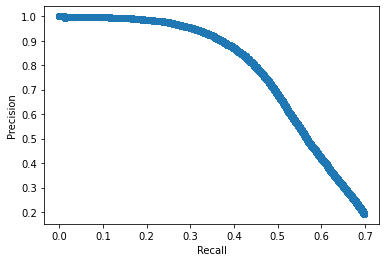

In [6]:
print("Precision-recall curve:")
pr_curve.plot().show()

## Wrapping Up

dataTap offers a wide variety of utilities for interacting with and using complex data. For more information on the functionality provided by dataTap, take a look at the following resources

- [datatap.dev](https://datatap.dev)
- [Official Documentation](https://docs.datatap.dev)
- [Public Github](https://github.com/zensors/datatap-python)

Additionally, if you have any questions about using dataTap, or integrating it into your existing workflow, please reach out to us.